In [2]:
import os
import sys

import matplotlib.pyplot as plt
from hydra import initialize, compose
from glob import glob
import pickle
import numpy as np

# set paths to various directories based on the machine this code is being executed on
with initialize(version_base=None, config_path='../config'):
    config = compose(config_name='config.yaml')  # overrides=['machine=uzay']

array_dir, data_dir, figure_dir, pickle_dir, repo_dir  = config.machine.array_dir, config.machine.data_dir, config.machine.figure_dir, config.machine.pickle_dir, config.machine.repo_dir

# enable use of local modules
if repo_dir not in sys.path:
    sys.path.append(repo_dir)

# set matplotlib style
plt.style.use(f'{repo_dir}/mejiro/mplstyle/science.mplstyle')

from mejiro.lenses import lens_util
from mejiro.plots import plot
from mejiro.utils import util
from mejiro.helpers import color

In [3]:
side = 10

In [4]:
pandeia_dir = os.path.join(array_dir, '04_pandeia_output_color')
pandeia_files = glob(pandeia_dir + '/pandeia_*')[:side ** 2]
pandeia_images = [np.load(i) for i in pandeia_files]

In [13]:
f106, f129, f158, f184 = [], [], [], []

for i in range(side ** 2):
    all_filters = glob(pandeia_dir + f'/pandeia_{str(i).zfill(8)}_*.npy')
    f106.append([np.load(i) for i in all_filters if 'f106' in i][0])
    f129.append([np.load(i) for i in all_filters if 'f129' in i][0])
    f158.append([np.load(i) for i in all_filters if 'f158' in i][0])
    f184.append([np.load(i) for i in all_filters if 'f184' in i][0])

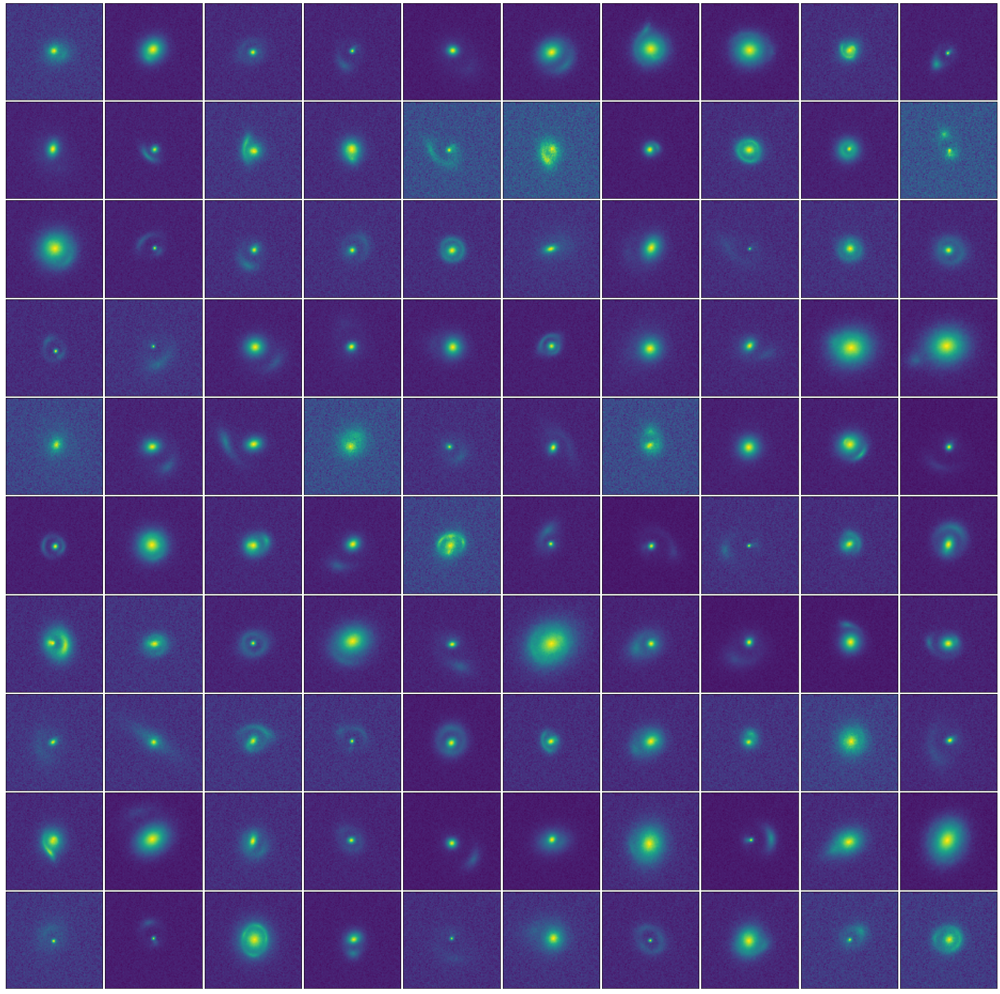

In [18]:
plot.plot_grid(f106, side=side, log10=True)

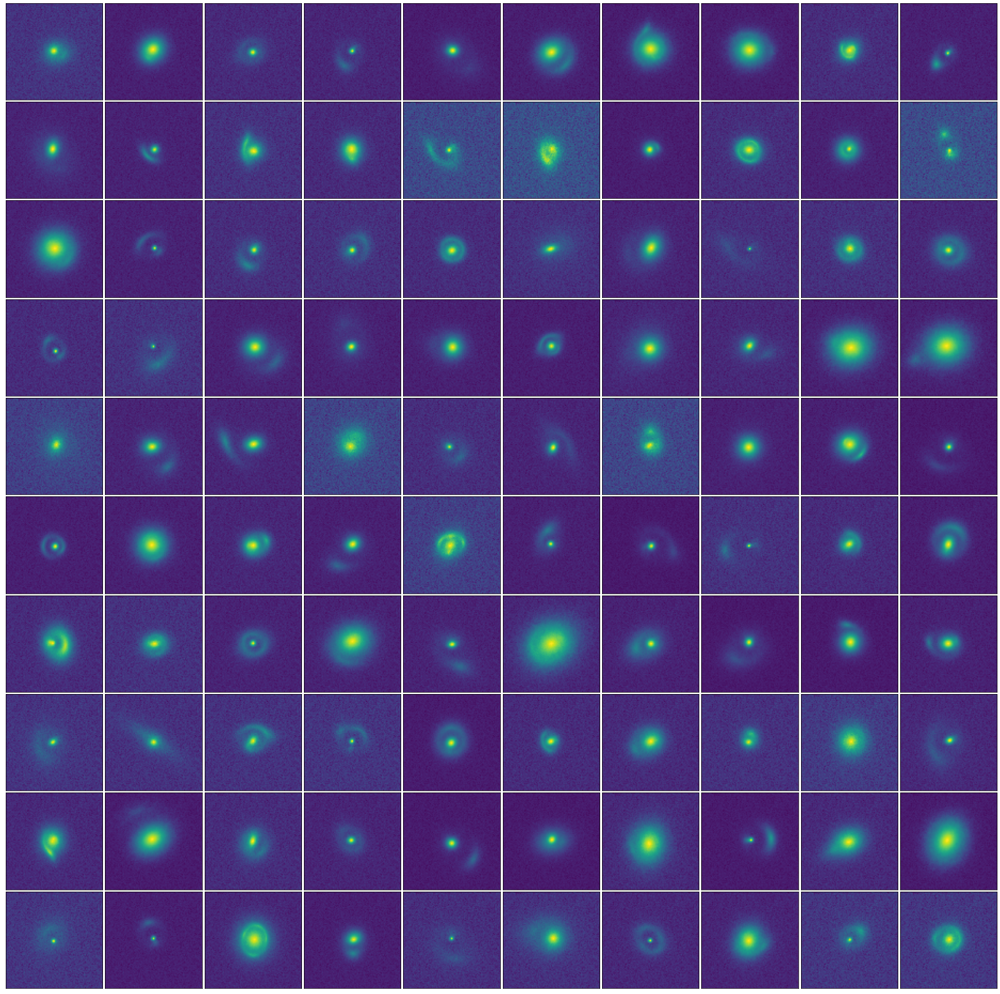

In [19]:
plot.plot_grid(f129, side=side, log10=True)

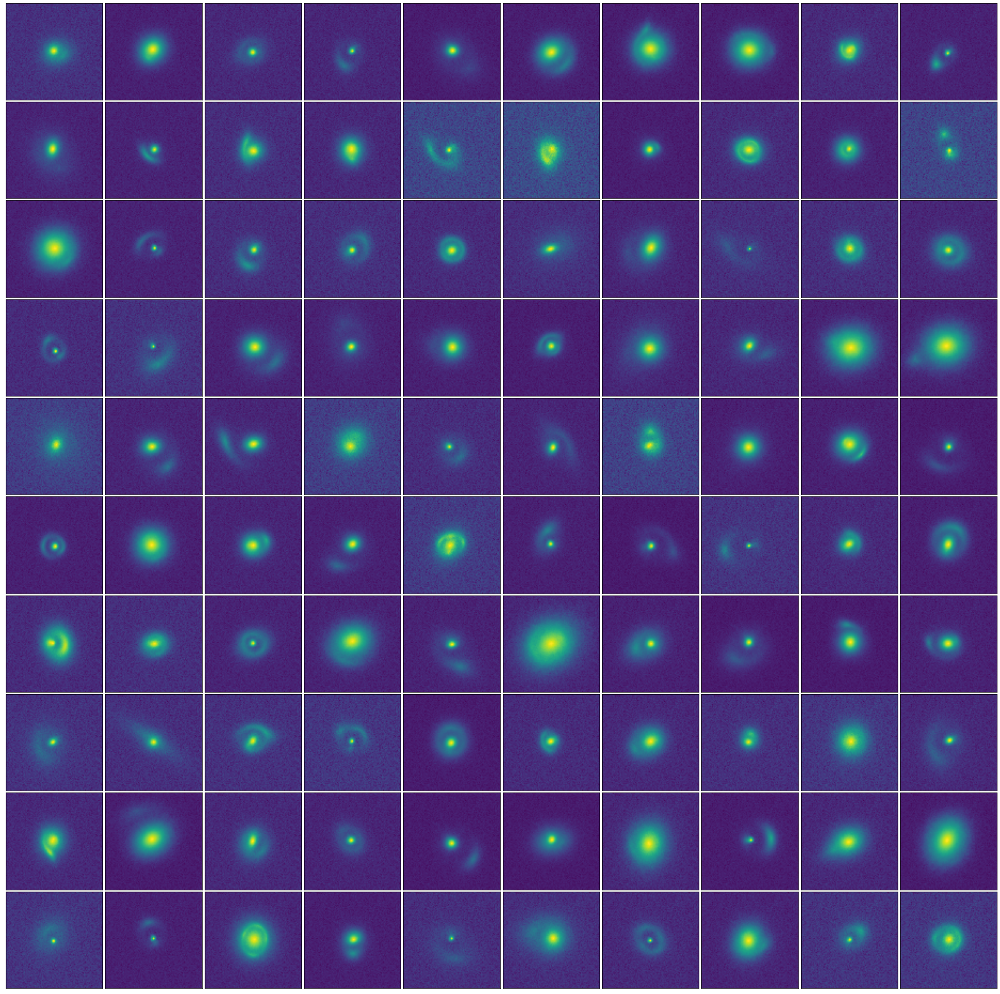

In [20]:
plot.plot_grid(f158, side=side, log10=True)

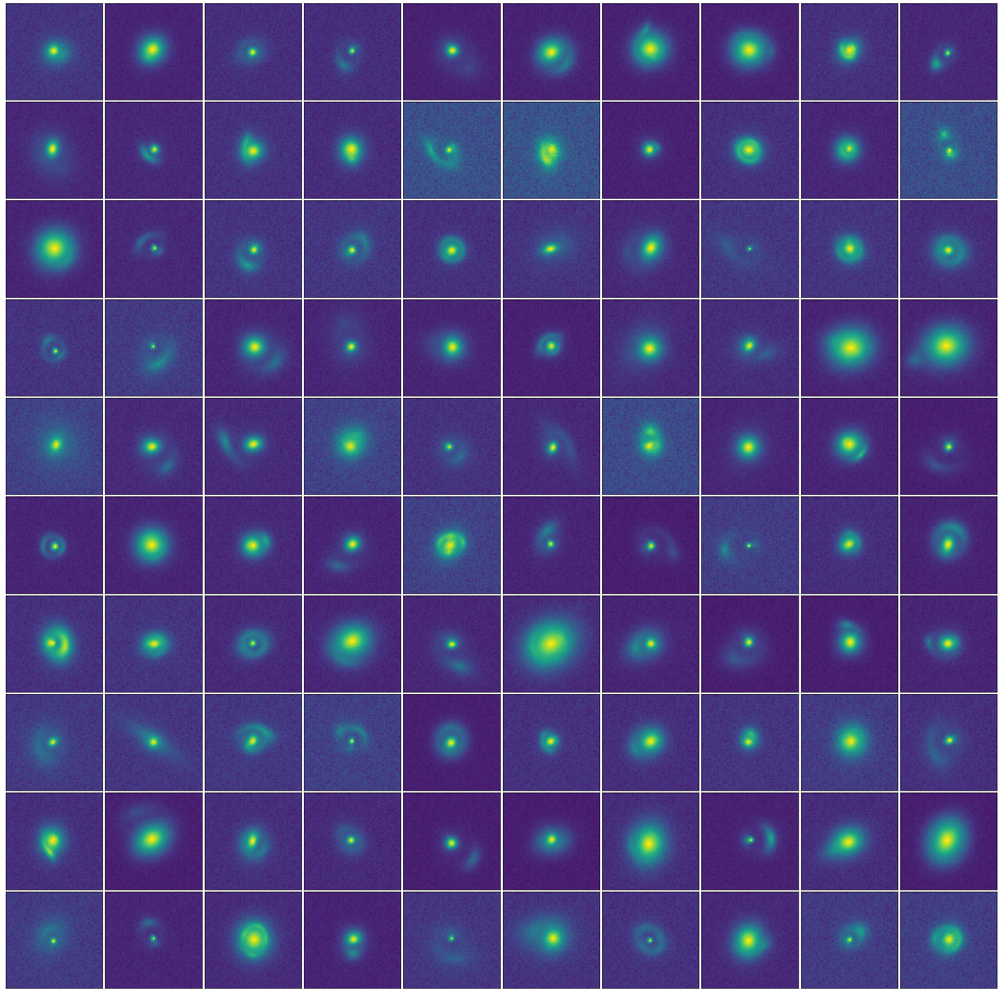

In [21]:
plot.plot_grid(f184, side=side, log10=True)